# Using Goals in Codex: Persistent Objectives for Long-Running Work

Goals are persistent objectives in Codex that keep a thread working toward a defined outcome across turns. A Goal gives Codex a completion condition: what should be true, how success should be checked, and what constraints must stay intact.

Codex already works well for well-scoped coding tasks: inspect a repository, fix a bug, add a test, explain a failure, or implement a focused change. Goals are for tasks where the next step depends on what Codex learns along the way: profiling, patching, benchmarking, reproducing a flaky test, or turning a research question into an evidence-backed audit.

Those tasks do not need a bigger prompt. They need a persistent objective. With a Goal, Codex can keep the objective in view, evaluate whether the work is done, and choose the next useful action without you restating the target after every intermediate result.

A Goal is not background autonomy without boundaries. It is a scoped, user-controlled completion contract. You define the outcome, Codex works against the evidence in the thread, and the Goal can be paused, resumed, cleared, completed, or stopped by budget.



## What you will learn

By the end of this guide, you will be able to:
- Decide when a Goal is a better fit than a one-off prompt.
- Write a Goal with a measurable outcome, a verification surface, and constraints.
- Use `/goal`, `/goal pause`, `/goal resume`, and `/goal clear` to manage the lifecycle.

## Prerequisites

- A Codex build that supports Goals.
- A task with a clear finish line and an evidence source you can inspect, such as tests, a benchmark, or a final artifact.
- Enough repository or research context for Codex to verify progress rather than merely narrate it.

## Outline

1. Start a Goal and manage its lifecycle.
2. Understand how Goals differ from one-off prompts.
3. Write Goals with auditable completion criteria.
4. Apply the pattern to complex research work.
5. Decide when a normal prompt is still the better tool.


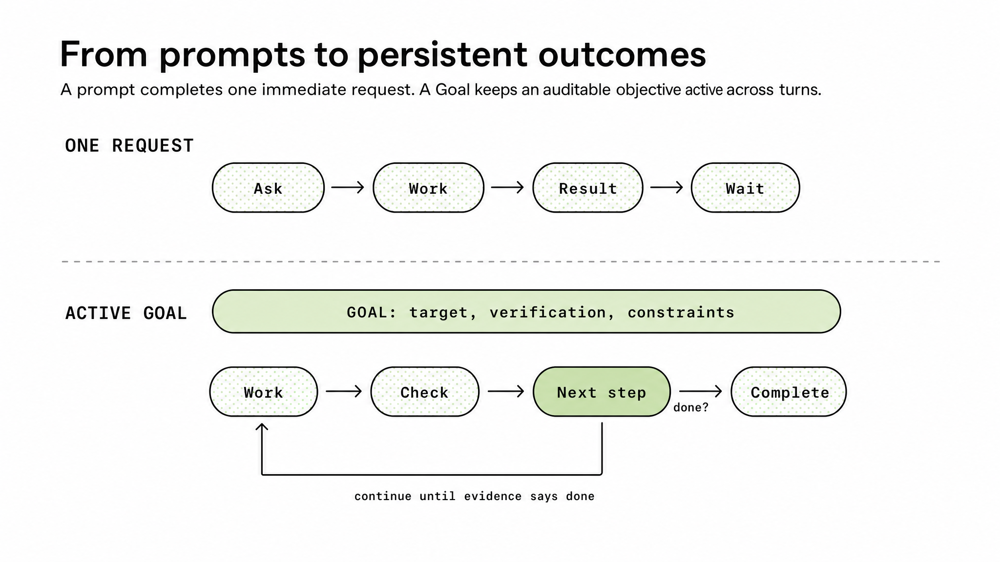

*Figure 1. A Goal turns a single-turn exchange into an evidence-checked continuation loop.*

## Quickstart: using Goals

Use a Goal when the task has a clear finish line but the path to that finish line is uncertain.
Good candidates include performance optimization, flaky test investigation, dependency migrations, bug hunts that require reproduction, multi-step refactors, benchmark-driven tuning, and research tasks that require a final artifact. A normal prompt remains the right tool for a one-off edit.

To use Goals, install or update Codex and confirm your version. Goals are available starting in Codex 0.128.0.

With npm:

```bash
npm install -g @openai/codex@latest
codex --version
```

With Homebrew:

```bash
brew update
brew upgrade --cask codex
codex --version
```

Then set a Goal with /goal followed by the outcome:

```text
/goal Reduce p95 latency below 120 ms without regressing correctness tests
```

You can manage the lifecycle from the same command surface:

```text
/goal      	View the current Goal
/goal pause    Pause an active Goal
/goal resume   Resume a paused Goal
/goal clear    Remove the current Goal
```

Once the Goal is active, Codex can inspect the code, run the relevant commands, make changes, test the result, and continue until it reaches a stopping condition. The stopping condition may be success, pause, clear, interruption, budget limit, or a blocker that requires user input.

Use Goals when you would otherwise find yourself saying the same thing after every turn:

```text
Keep going.
Try the next likely fix.
Run the benchmark again.
Now check the tests.
Continue until this is actually done.
```

A Goal makes that intent explicit.

## Goals vs prompts

A normal prompt says: do this next thing.

A Goal says: keep working until this outcome is true.
That distinction matters. In a normal request, Codex works through the immediate instruction, reports a result, and waits. With a Goal, Codex has a durable target attached to the thread. After a turn finishes, it can inspect the current evidence and decide whether the objective is satisfied. If the answer is no, and the Goal remains active and within budget, Codex can continue from the latest state.

That makes Goals most useful when the correct next action depends on what Codex just learned. For example:

```text
/goal Reduce p95 checkout latency below 120 ms on the checkout benchmark while keeping the correctness suite green
```

This request asks for more than better performance. It gives Codex a measurable outcome, a verification surface, and a constraint. Codex can run the benchmark, inspect the hot path, make a targeted change, rerun the benchmark, run the correctness suite, and continue if the result is still not good enough.

The practical mental model is simple:

Prompt:  ask -> work -> result -> wait

Goal:    work -> check -> continue or complete

A Goal gives Codex a finish line. The work still has to be audited against evidence.

## How to write a Goal

A good Goal is more than a larger prompt. It is a compact contract for how Codex should work, what counts as success, and what should happen if success is not yet reachable.

The strongest Goals usually define six things:
* Outcome: what should be true when the work is done.
* Verification surface: the test, benchmark, report, artifact, command output, or source material that proves it.
* Constraints: what must not regress while Codex works.
* Boundaries: which files, tools, data, repositories, or resources Codex may use.
* Iteration policy: how Codex should decide what to try next after each attempt.
* Blocked stop condition: when Codex should stop and report that no defensible path remains under the current limits.

A useful pattern is:

```text
/goal <desired end state> verified by <specific evidence> while preserving <constraints>. Use <allowed inputs, tools, or boundaries>. Between iterations, <how Codex should choose the next best action>. If blocked or no valid paths remain, <what Codex should report and what would unlock progress>.
```

For example, this Goal is workable but still fairly thin:

```text
/goal Reduce p95 checkout latency below 120 ms without regressing correctness tests
```

A stronger version gives Codex a fuller operating contract:

```text
/goal Reduce p95 checkout latency below 120 ms, verified by the checkout benchmark, while keeping the correctness suite green. Use only the checkout service, benchmark fixtures, and related tests. Between iterations, record what changed, what the benchmark showed, and the next best experiment to try. If the benchmark cannot run or no valid paths remain, stop with the attempted paths, the evidence gathered, the blocker, and the next input needed.
```

For research and investigation, the same principle applies. Define the evidence standard before the work begins, especially when exact proof may not be available:

```text
/goal Produce the strongest evidence-backed reproduction of the paper using the available materials and local resources. Attempt the headline results where feasible, verify outputs where possible, and end with a report that separates confirmed findings, approximate reconstructions, blocked claims, and remaining uncertainty.
```

That kind of Goal gives Codex room to investigate while keeping the final result honest. It goes beyond "keep going" by defining what "done," "blocked," and "still uncertain" mean.

When the task is clear but the Goal is not, Codex can help write the Goal itself. A simple two-step workflow works well: first, describe the work in plain language and ask Codex to turn it into a draft Goal; second, review that draft and tighten the success condition, verification surface, constraints, and blocked stop condition before activating it.

For example:

```text
Help me turn this into a strong `/goal`: I want Codex to keep working on this flaky checkout test until we either fix it with evidence or can clearly explain what is blocking progress.
```

Codex can then propose a more complete Goal, ask for any genuinely necessary missing detail, and leave you with a cleaner `/goal` to use.

## What changes when a Goal is active

When a Goal is active, three things change.

First, the objective stays visible. If Codex runs a test and it fails, the thread still has the original target. If a benchmark improves but misses the threshold, Codex can keep going. If a research path hits missing data, Codex can adjust the evidence plan without losing sight of the research standard.

Second, continuation becomes possible from an idle thread. Codex does not continue while another turn is active, while user input is queued, or while other thread work is pending. It continues only when the thread is idle and the Goal is active and within budget.
Third, completion must be evidence-based. A Goal should not be marked complete because the model believes it is probably done. It should be complete only after the objective is checked against the relevant files, tests, logs, benchmark output, generated artifacts, or other concrete evidence.

That is the design center: Codex can keep moving, but the evidence decides whether it is done.

## How Goals are designed in Codex

Goals are implemented as persisted thread state, not as global memory and not as project-level instructions. That design choice is important: the objective belongs to the thread where the relevant context lives, including the files Codex inspected, the commands it ran, the diffs it produced, the logs it saw, and the reasoning trail it built up.



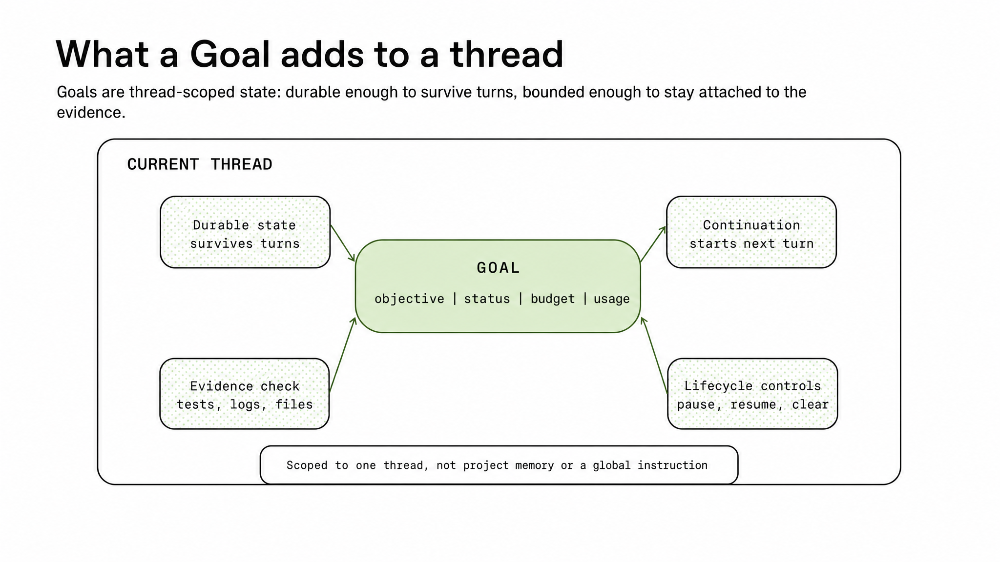

*Figure 2. A Goal adds durable state, continuation, controls, and evidence checks to the current thread.*

At the architecture layer, a Goal is a durable, thread-scoped state. It records the objective, lifecycle, budget, and progress accounting that Codex needs to evaluate the thread over time. The key boundary is scope: the Goal belongs to the current thread, not to global memory or project instructions.

Codex treats that state as a contract between the user, the model, and the thread. A Goal can be active, paused, complete, or budget-limited. Those states determine whether Codex may continue, whether it should wait for the user, and whether it should summarize progress instead of beginning new work.

Continuation is event-driven rather than a simple loop. Codex checks for continuation only at safe boundaries: after a turn has finished, when no other work is pending, when no user input is queued, and when the thread is idle.

The dispatcher's behavior is deliberately conservative. Plan-only work does not trigger continuation. Interruptions pause the objective. Resuming a thread can restore the objective when appropriate. If a continuation turn makes no tool call, the next automatic continuation is suppressed so Codex does not spin.



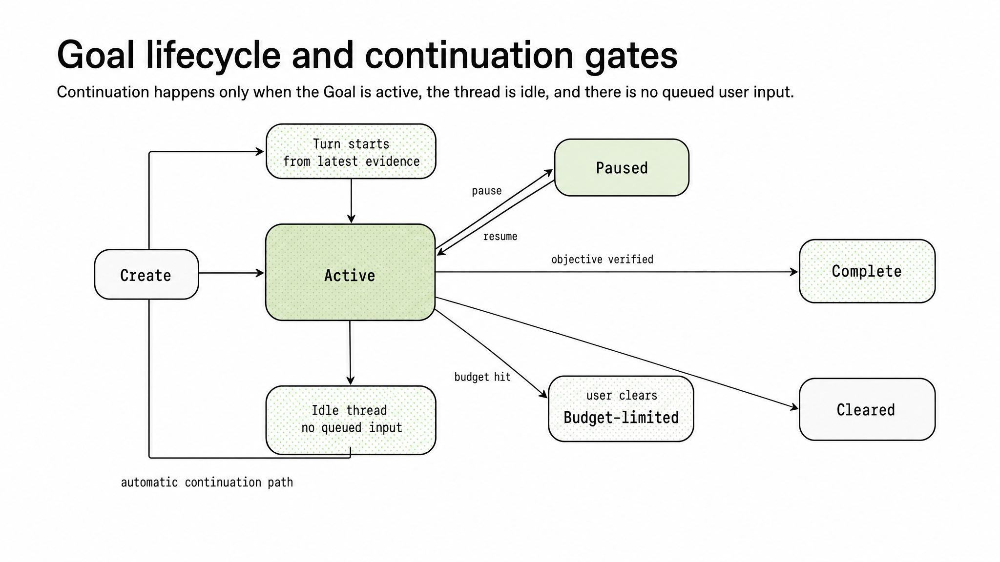

*Figure 3. Codex continues only when the Goal is active, the thread is idle, and no user input is queued.*

The prompting layer reinforces the same architecture. Continuation prompts orient Codex around the active objective, but they also require an audit before completion. Codex must compare the objective to concrete evidence: files changed, commands run, tests passed, benchmark output, generated artifacts, or research evidence.

Budget handling is explicit. When the budget is reached, Codex should stop substantive work, summarize progress and blockers, and identify the next useful step. Reaching a budget limit is not the same as completing the objective.

The tool contract keeps lifecycle authority bounded. The model can start a Goal and can mark an existing Goal complete only when the evidence supports completion. Pausing, resuming, clearing, and budget-limited transitions remain controlled by the user or the system.

This is the architecture to keep in mind: a Goal is a thread-scoped completion contract. It combines durable objective state, lifecycle controls, continuation policy, budget accounting, and evidence-based completion. The point is not to make Codex loop forever; it is to let the objective persist until the evidence says the work is done.

## Turning a weak Goal into a strong one

Weak:

```text
/goal Improve performance
```

Strong:

```text
/goal Reduce p95 latency below 120 ms on the checkout benchmark while keeping the correctness test suite green
```

### Example: performance tuning

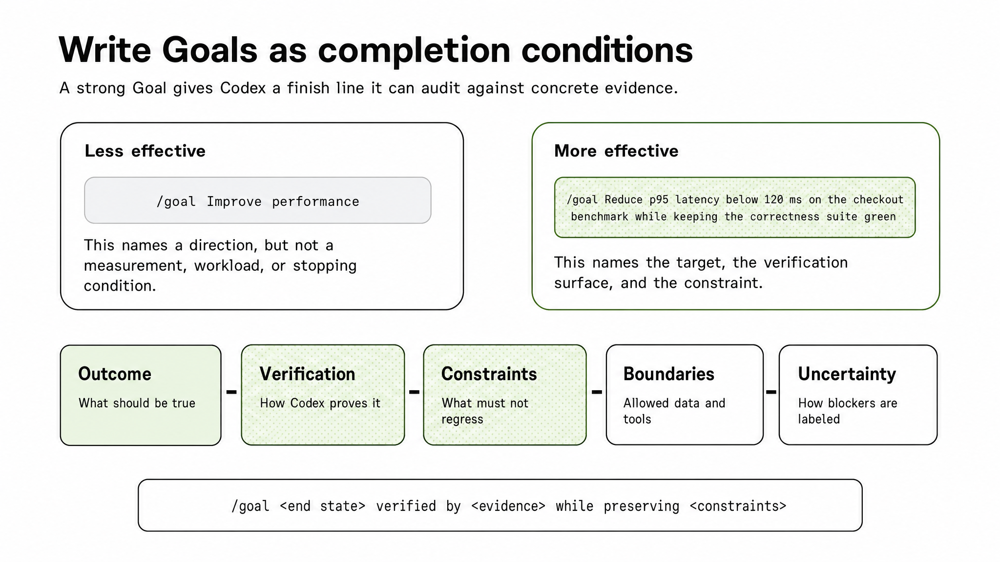

*Figure 4. Strong Goals name the end state, verification surface, and constraints.*

The stronger version gives Codex three things: an outcome, a verification method, and a constraint. It also gives Codex a way to know when not to stop. If p95 improves from 180 ms to 135 ms, the Goal is not done. If latency drops below 120 ms but correctness tests fail, the Goal is not done. If the benchmark cannot be run, Codex must surface that blocker rather than declare success.

The same rule applies beyond performance work: the Goal should stay specific enough to verify, but open enough to support discovery.

A Goal should be narrow enough to audit but broad enough to let Codex choose the next action. Fix the failing checkout test may be too narrow if the real issue is an upstream dependency. Improve the whole system is too broad because there is no audit surface. Make the checkout test suite pass on the current branch without changing public API behavior is much better.

The same principle applies to generated artifacts. A weak Goal says:

```text
/goal Write docs for this feature
```

A stronger Goal says:

```text
/goal Produce a docs page for Goals that explains the lifecycle, command surface, and two examples. Verify that the page builds locally and that all referenced commands match the current CLI behavior.
```

The second Goal gives Codex something it can inspect: a page, a build command, and command behavior.

This same discipline is even more important for research Goals. Define the evidence standard before the investigation begins: what counts as exact reproduction, what counts as partial reconstruction, what counts as proxy support, and what should be treated as blocked.

A strong research Goal should ask Codex to build a claim inventory, map claims to evidence, implement feasible pieces, label blockers, and produce an audit that separates confirmed claims, support-only evidence, blocked claims, and remaining uncertainty.

This keeps the Goal narrow enough to audit without prescribing the entire path. Codex can choose the next action, but the completion standard is fixed.

## Using Goals for complex research: reproducing a quant paper

Here is a concrete example of a research Goal that uses those principles.

The case study is Buehler, Gonon, Teichmann, and Wood’s Deep Hedging. The paper asks whether neural trading strategies can reproduce model-based hedges under different risk preferences, transaction costs, and higher-dimensional market setups. The right Goal was not to “reproduce the paper” in the abstract. It was to attempt the paper’s headline numerical claims, separate exact mechanics from approximate trained replacements, and be explicit about what cannot be exactly replayed from the available materials.

A weak research Goal would be:

```text
/goal Reproduce Buehler et al., "Deep Hedging"
```

That is underspecified. It does not say which section matters, what counts as reproduction, how to handle unavailable training state, or how to distinguish a close numerical match from an exact replay.

A better Goal is:

```text
/goal Produce the strongest evidence-backed reproduction of Buehler et al., "Deep Hedging," using the available paper materials and local resources. Attempt every headline result, verify the outputs, and end with a report that separates reproduced mechanics, approximate trained results, blocked exact replay, and remaining uncertainty.
```

The stronger version works because it names the evidence standard and the final artifact. Codex is not merely trying to produce an impressive reproduction. It is trying to minimize uncertainty without overstating what the available evidence supports.



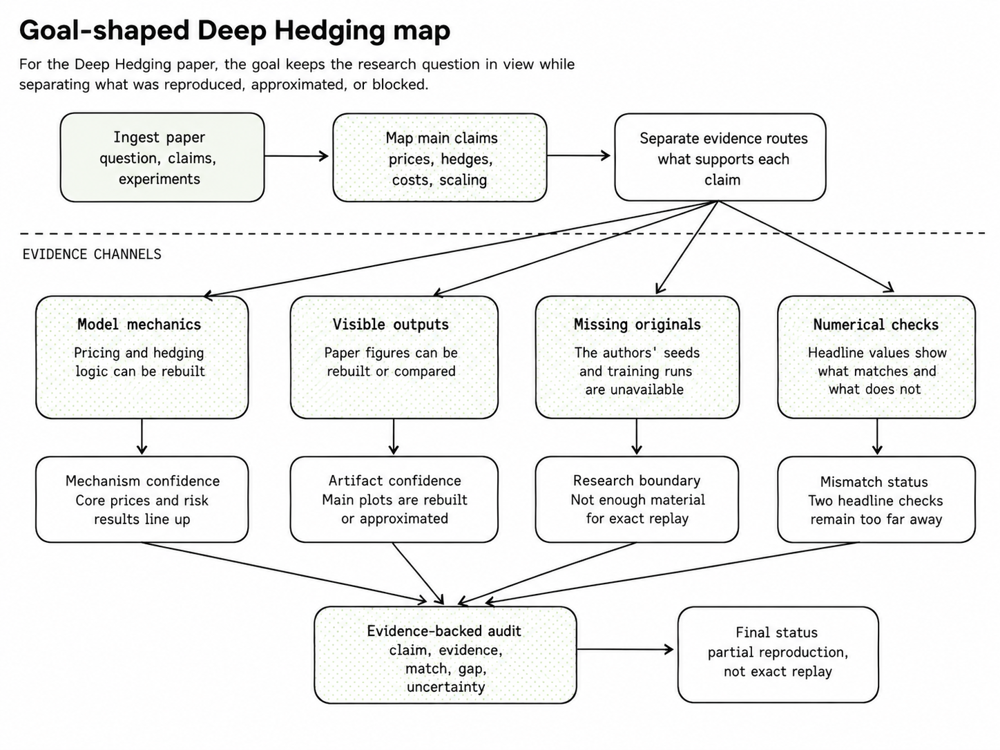

*Figure 5. A research Goal decomposes the paper into evidence channels before declaring status.*

In practice, the Goal gave the investigation a concrete operating contract.

Codex used it to:
* separate headline claims from supporting claims,
* map those claims to available evidence,
* rebuild the parts that could be tested locally,
* and label claims that could not be reproduced exactly from the available materials.

Several pieces were feasible. Codex rebuilt the pricing and hedging mechanics, reproduced the Heston reference price, trained policies for the CVaR hedge experiments, rebuilt the main histogram and hedge-surface artifacts, reproduced the Black-Scholes transaction-cost slope, and ran trained checks for the Heston transaction-cost and high-dimensional examples. 

Some claims remained blocked by missing source material. The paper does not provide the exact random seeds, generated training paths, TensorFlow graph, optimizer state, checkpoints, or full original simulation state. That means the strongest honest result is a partial and approximate reproduction, not an exact neural replay.

This is why the Goal matters. It keeps the work moving after blockers appear, but it also keeps the final language honest. A trained replacement can support a claim, a close numerical match can raise confidence, and a rebuilt figure can validate part of the result, but none of those should be described as recovering the original experiment exactly.



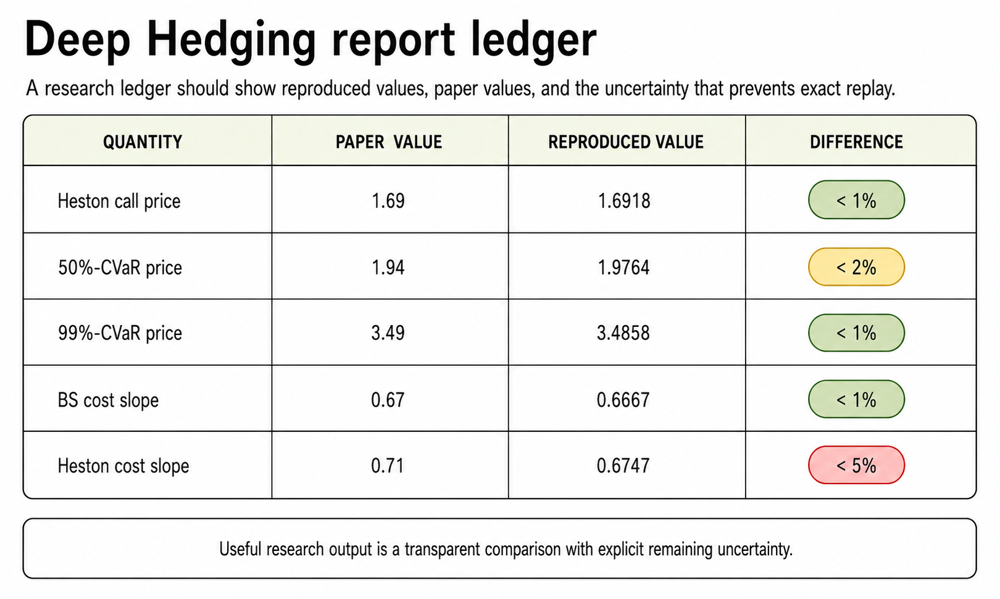

*Figure 6. The final output should preserve different levels of epistemic support.*

The final report should preserve those different levels of support instead of flattening them into a single success claim.
For example, one ledger entry could look like this:

```text
Claim: Deep hedging approximates complete-market Heston hedge without transaction costs.
Route: Rebuilt model mechanics, reference hedge comparison, and trained neural policy.
Evidence surface: Price checks, histograms, and hedge surfaces.
Status: Close approximate reproduction.
Remaining uncertainty: Original training paths, seeds, and checkpoints are unavailable.
```

That is the demo value of Goals in research. They let Codex keep working through ambiguity while preventing a plausible artifact from becoming an overclaimed conclusion. The Goal defines what finished means: a claim-by-claim audit grounded in evidence, explicit about approximations, and honest about the boundary between reproduction and replay.

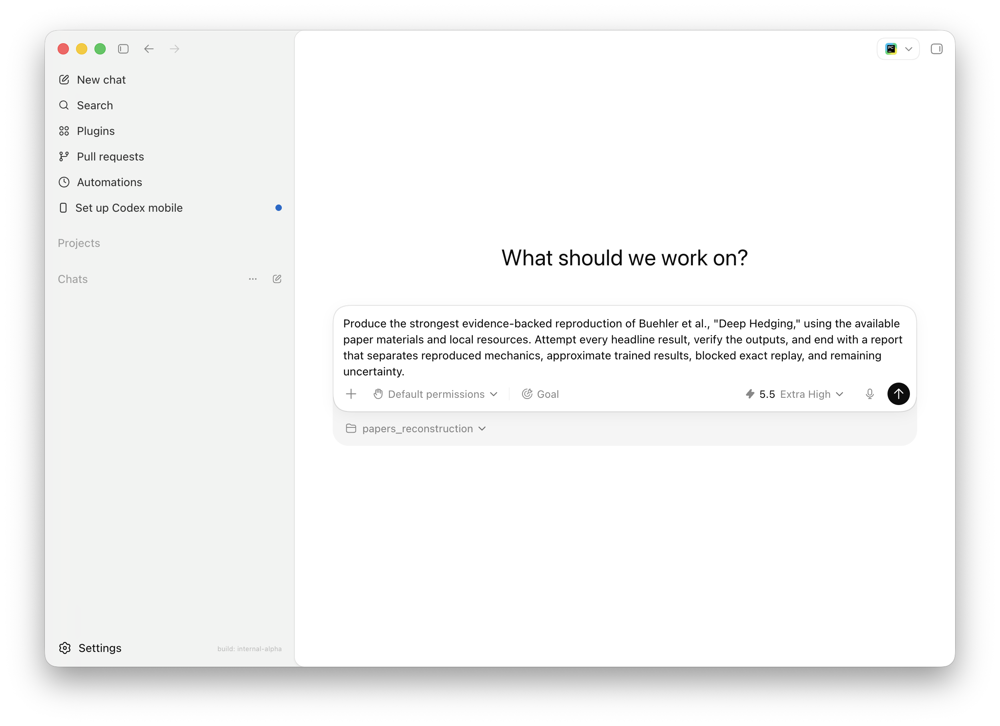

## When not to use Goals

Goals are not the right tool for every task.

Do not use a Goal for a one-line edit, a simple explanation, a short code review, or a question where you want one answer and then a stop. A normal Codex prompt is better for that.

Do not use a Goal when the finish line is vague. Make this better gives Codex no reliable completion condition. Refactor this code is also weak unless you define the expected end state, tests, and constraints.

Do not use a Goal to hide uncertainty. If the data may be unavailable, say so in the Goal. If a benchmark may be flaky, say how to handle that. If proxy evidence is allowed, define how it should be labeled.

Goals are strongest when the task has three properties: a durable objective, an evidence-based finish line, and a path that may require several turns of investigation.

## Conclusion: Let the objective persist, but let evidence decide

Goals change the operating model of Codex. They turn a thread from a sequence of isolated prompts into a stateful work loop around a defined outcome.

The architecture is intentionally bounded. The Goal is scoped to a thread, carries lifecycle state and budget accounting, and can be paused, resumed, cleared, completed, or stopped by budget. Codex can keep moving, but only inside the contract the user defined.
That makes Goals useful for the work where Codex is already most valuable: debugging, optimization, migration, testing, and research. The user supplies the objective. Codex follows the evidence. The Goal keeps both connected until the work is either complete or honestly blocked.

For complex research, that is the difference between generating an answer and producing an audit. A good Goal does not merely ask Codex to finish. It tells Codex what finished means.